In [1]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install pandas geopandas scikit-learn matplotlib

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install haversine

Note: you may need to restart the kernel to use updated packages.


In [4]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns

import folium
from folium import plugins
from folium import Map
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster

from haversine import haversine

from IPython.display import IFrame

from sklearn.cluster import DBSCAN

In [5]:
# Read the dataset
dataset = pd.read_csv('C:/Users/reema/OneDrive - University of Moratuwa/Desktop/SDA (DA3480)/IndividualAssignment/New York City Taxi Fare Prediction.csv')
dataset.head(3)

,key,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,2015-01-27 13:08:24.0000002,2015-01-27 13:08:24 UTC,-73.973320,40.763805,-73.981430,40.743835,1
1,2015-01-27 13:08:24.0000003,2015-01-27 13:08:24 UTC,-73.986862,40.719383,-73.998886,40.739201,1
2,2011-10-08 11:53:44.0000002,2011-10-08 11:53:44 UTC,-73.982524,40.751260,-73.979654,40.746139,1


In [6]:
# Display information about the dataset
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9914 entries, 0 to 9913
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   key                9914 non-null   object 
 1   pickup_datetime    9914 non-null   object 
 2   pickup_longitude   9914 non-null   float64
 3   pickup_latitude    9914 non-null   float64
 4   dropoff_longitude  9914 non-null   float64
 5   dropoff_latitude   9914 non-null   float64
 6   passenger_count    9914 non-null   int64  
dtypes: float64(4), int64(1), object(2)
memory usage: 542.3+ KB


In [7]:
pd.set_option('float_format', '{:f}'.format)
dataset.describe()

,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
count,9914.000000,9914.000000,9914.000000,9914.000000,9914.000000
mean,-73.974722,40.751041,-73.973657,40.751743,1.671273
std,0.042774,0.033541,0.039072,0.035435,1.278747
min,-74.252193,40.573143,-74.263242,40.568973,1.000000
25%,-73.992501,40.736125,-73.991247,40.735254,1.000000
50%,-73.982326,40.753051,-73.980015,40.754065,1.000000
75%,-73.968013,40.767113,-73.964059,40.768757,2.000000
max,-72.986532,41.709555,-72.990963,41.696683,6.000000


In [8]:
dataset.shape

(9914, 7)

In [9]:
# Check for null values
pd.DataFrame(dataset.isnull().sum(), columns=["Train Null Count"])

,Train Null Count
key,0
pickup_datetime,0
pickup_longitude,0
pickup_latitude,0
dropoff_longitude,0
dropoff_latitude,0
passenger_count,0


In [10]:
# Convert pickup_datetime to datetime format
dataset['pickup_datetime'] = pd.to_datetime(dataset['pickup_datetime'])

# Drop the 'key' column if it's just an index
dataset = dataset.drop(columns=['key'])

# Verify coordinate ranges (for NYC)
valid_latitude_range = (40.4774, 40.9176)
valid_longitude_range = (-74.2591, -73.7004)

# Filter out rows with invalid coordinates
dataset = dataset[(dataset['pickup_latitude'].between(*valid_latitude_range)) & (dataset['pickup_longitude'].between(*valid_longitude_range))]
dataset = dataset[(dataset['dropoff_latitude'].between(*valid_latitude_range)) & (dataset['dropoff_longitude'].between(*valid_longitude_range))]

# Check for and handle outliers in passenger_count
dataset = dataset[dataset['passenger_count'] <= 6]

In [11]:
# Calculate the haversine distance by extracting pickup and dropoff latitude and longitude coordinates
def get_total_distance(df):
    a1 = df['pickup_latitude']
    a2 = df['dropoff_latitude']
    
    b1 = df['pickup_longitude']
    b2 = df['dropoff_longitude']

    pick_up = (a1, b1) 
    drop_off = (a2, b2)
    return haversine(pick_up, drop_off)

In [12]:
# Create new column that contains the calculated total distances
dataset['total_distance'] = dataset.apply(lambda x: get_total_distance(x),axis=1)

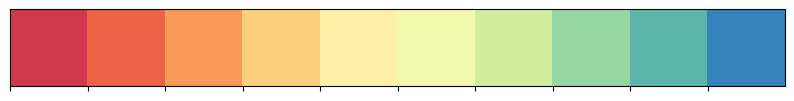

In [13]:
Spectral_palette = sns.color_palette("Spectral", 10)
sns.palplot(Spectral_palette)

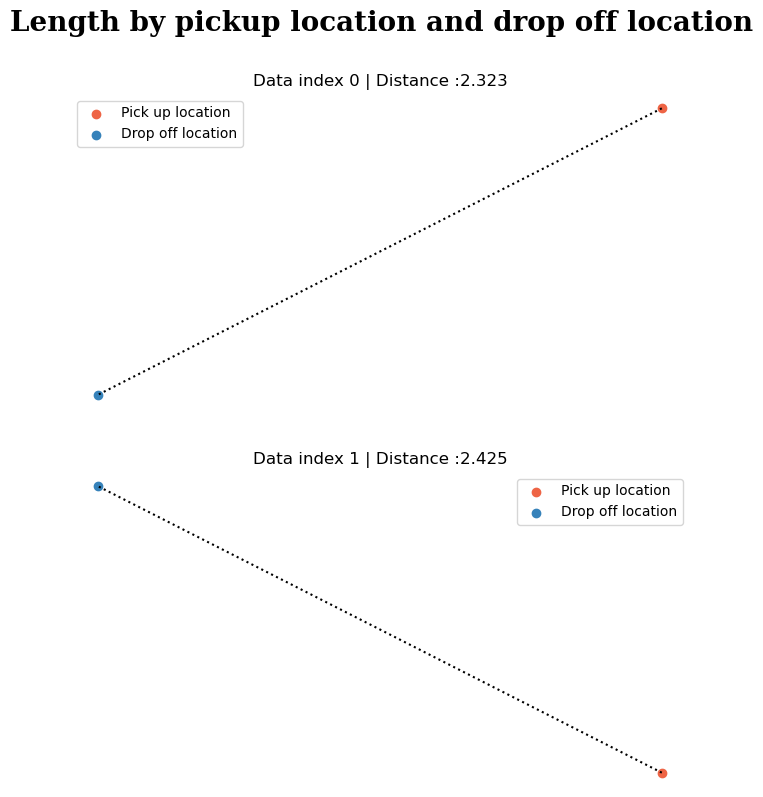

In [14]:
# Creating a subplot with two plots, 
# each displaying the pickup and dropoff locations for a specific data index along with the calculated distance
fig = plt.figure(figsize=(8,9))

for i in range(2):
    plt.subplot(2, 1, i+1)
    plt.title("Data index {} | Distance :{:.3f}".format(i, dataset['total_distance'][i]))
    plt.scatter(dataset['pickup_longitude'][i], dataset['pickup_latitude'][i], color=Spectral_palette[1], label="Pick up location")
    plt.scatter(dataset['dropoff_longitude'][i], dataset['dropoff_latitude'][i], color=Spectral_palette[-1], label="Drop off location")
    plt.plot([dataset['pickup_longitude'][i],dataset['dropoff_longitude'][i]],[dataset['pickup_latitude'][i],dataset['dropoff_latitude'][i]],'k:')
    plt.axis('off')
    plt.legend()
    
fig.text(0.05,0.95,"Length by pickup location and drop off location", fontweight="bold", fontfamily='serif', fontsize=20)
plt.show()

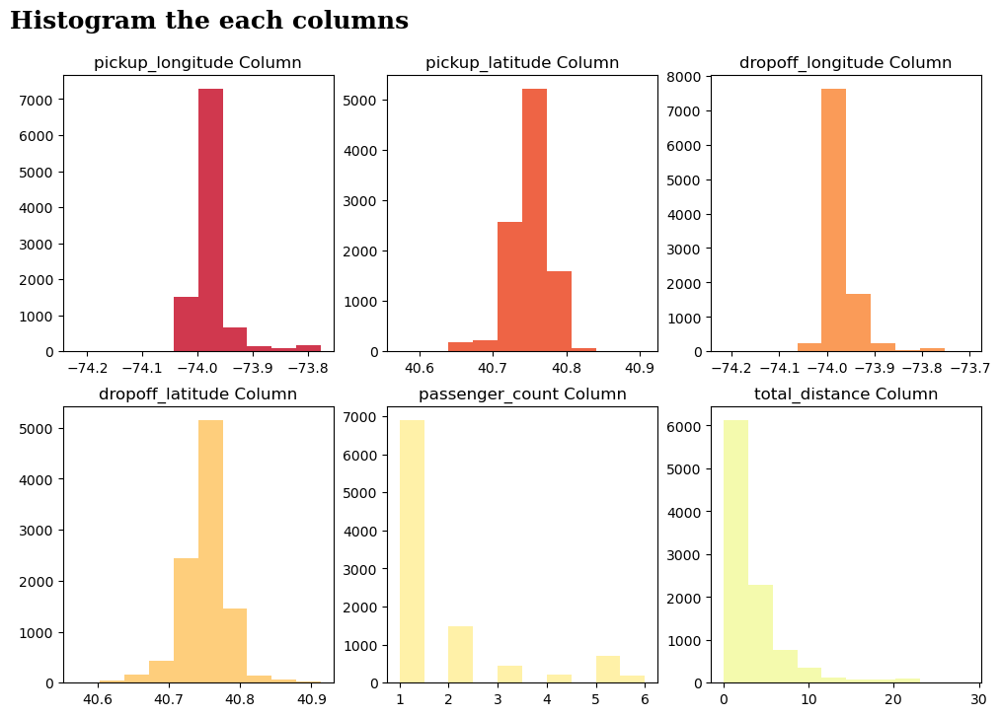

In [15]:
# Generating a subplot of histograms for selected columns in the dataset
df_index =[1,2,3,4,5,6]
fig = plt.figure(figsize=(12,8))

for num, i in enumerate(df_index):
    plt.subplot(2, 3,num+1)
    plt.title("{} Column".format(dataset.columns[i]))
    plt.hist(dataset.iloc[:,i], color=Spectral_palette[num])

fig.text(0.08,0.94,"Histogram the each columns", fontweight="bold", fontfamily='serif', fontsize=18)
plt.show()

In [16]:
# Function for data cleansing
def data_cleansing(df, data="Dataset"):
    
    print("Before cleansing shape : {}".format(df.shape))
    print("----- CLEANSING -----")
    
    # Remove rows with pickup longitude outside valid range
    df = df.drop(df[df['pickup_longitude'] <= -74.5].index)
    df = df.drop(df[df['pickup_longitude'] >= -73.5].index)
    print(df.shape)
   
    # Remove rows with pickup latitude outside valid range
    df = df.drop(df[df['pickup_latitude'] <= 40.4].index)
    df = df.drop(df[df['pickup_latitude'] >= 41].index)
    print(df.shape)
   
    # Remove rows with dropoff longitude outside valid range
    df = df.drop(df[df['dropoff_longitude'] <= -74.5].index)
    df = df.drop(df[df['dropoff_longitude'] >= -73.5].index)
    print(df.shape)
   
    # Remove rows with dropoff latitudw outside valid range
    df = df.drop(df[df['dropoff_latitude'] <= 40.4].index)
    df = df.drop(df[df['dropoff_latitude'] >= 41].index)
    print(df.shape)
       
    # Filter out rows with invalid passenger counts
    df = df.drop(df[df['passenger_count'] <= 0].index)
    df = df.drop(df[df['passenger_count'] >= 7].index)
    
    print("----- CLEANSING -----")
    print("After cleansing shape : {}".format(df.shape))
    
    return df

dataset = data_cleansing(dataset, "Dataset")

Before cleansing shape : (9900, 7)
----- CLEANSING -----
(9900, 7)
(9900, 7)
(9900, 7)
(9900, 7)
----- CLEANSING -----
After cleansing shape : (9900, 7)


In [17]:
# Creating a Folium map
center_coordinates = [40.730610, -73.935242]
zoom_level = 11
mymap = folium.Map(location=center_coordinates, zoom_start=zoom_level)

In [18]:
# Create lists of pickup and dropoff locations using zip
pickup_locations = list(zip(dataset.pickup_latitude, dataset.pickup_longitude))
dropoff_locations = list(zip(dataset.dropoff_latitude, dataset.dropoff_longitude))

# Add a MarkerCluster layer for better performance
marker_cluster_pickup = plugins.MarkerCluster().add_to(mymap)
marker_cluster_dropoff = plugins.MarkerCluster().add_to(mymap)

# Add markers for pickup and dropoff locations
for location in pickup_locations:
    folium.Marker(location=location).add_to(marker_cluster_pickup)

for location in dropoff_locations:
    folium.Marker(location=location).add_to(marker_cluster_dropoff)

display(mymap)

In [19]:
# Create a new Folium map without the existing markers and clusters
heatmap_map = Map(location=center_coordinates, zoom_start=zoom_level)

# Create a heatmap for pickup locations and add it to the new map
HeatMap(pickup_locations).add_to(heatmap_map)

display(heatmap_map)

In [22]:
# Create a GeoDataFrame from the DataFrame
gdf = gpd.GeoDataFrame(dataset, geometry=gpd.points_from_xy(dataset.pickup_longitude, dataset.pickup_latitude))

# Perform clustering using DBSCAN
eps = 0.01
min_samples = 5
dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='haversine')
dataset['cluster'] = dbscan.fit_predict(gdf[['pickup_longitude', 'pickup_latitude']])

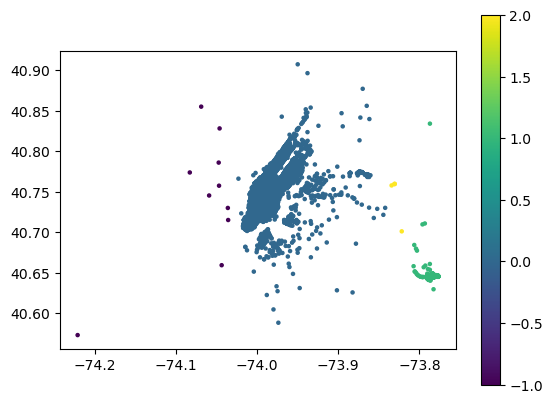

In [23]:
# Plot the clusters on a map
gdf.plot(column='cluster', cmap='viridis', legend=True, markersize=5)

plt.show()

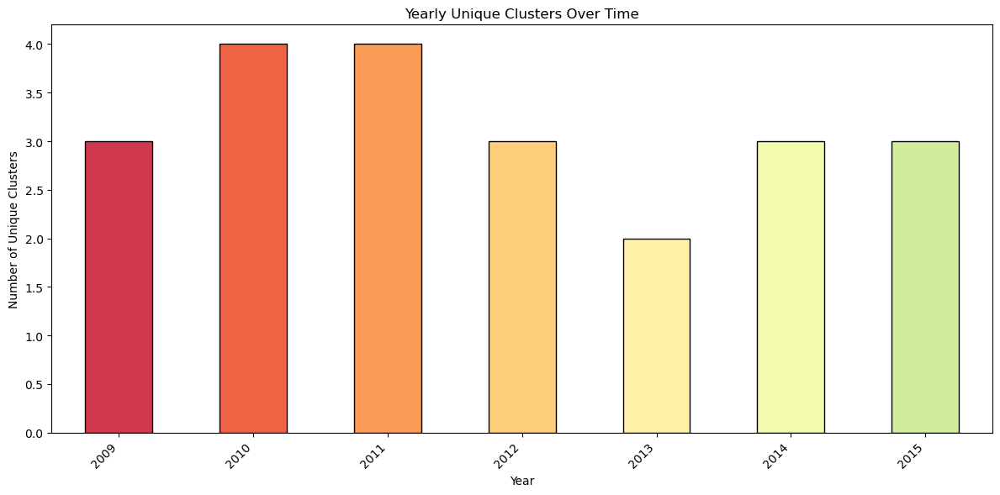

In [24]:
dataset['timestamp'] = pd.to_datetime(dataset['pickup_datetime'])
dataset.set_index('timestamp', inplace=True)

# Extracting the year and resampling
dataset['year'] = dataset.index.year
yearly_cluster_counts = dataset.groupby('year')['cluster'].nunique()

# Plotting with improved formatting
plt.figure(figsize=(12, 6))
yearly_cluster_counts.plot(kind='bar', color=Spectral_palette, edgecolor='black')  
plt.title('Yearly Unique Clusters Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Unique Clusters')
plt.xticks(rotation=45, ha='right')  
plt.tight_layout()  
plt.show()

In [25]:
eps = 0.01
min_samples = 5
dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='haversine')
dataset['cluster'] = dbscan.fit_predict(dataset[['pickup_longitude', 'pickup_latitude']])

# Create a map centered around the average pickup location
avg_pickup_latitude = dataset['pickup_latitude'].mean()
avg_pickup_longitude = dataset['pickup_longitude'].mean()
zoom_level = 11
m = folium.Map(location=[avg_pickup_latitude, avg_pickup_longitude], zoom_start=zoom_level)

# Create MarkerCluster for each cluster
marker_cluster = MarkerCluster().add_to(m)

# Add markers to the map
for index, row in dataset.iterrows():
    folium.Marker([row['pickup_latitude'], row['pickup_longitude']],
                  popup=f"Cluster: {row['cluster']}",
                  icon=None).add_to(marker_cluster)

# Display the map in the Jupyter Notebook
display(m)